Student Name : MUHAMMAD AJRUL AMIN BIN MOHD ZAIDI

Matric Number : A194789

The Natural Language Toolkit (NLTK) is a popular open-source software library designed to help developers work with human language data. NLTK provides a range of tools and resources to assist with tasks such as text processing, tokenization, part-of-speech tagging, named entity recognition, sentiment analysis, machine translation, and more.



## NLTK Corpora : Twitter Corpus

In this activity, you will be using Twitter corpus.  


* **twitter corpus**: a collection of approximately 20,000 tweets that were collected during a six-month period in 2009.

In [1]:
# import nltk library
import nltk

## Twitter Corpus
The Twitter Corpus is a collection of tweets (short messages posted on Twitter) that has been compiled and made available for research and analysis in the Natural Language Toolkit (NLTK) library. The corpus consists of approximately 20,000 tweets that were collected during a six-month period in 2009.

In [2]:
#collapse-hide
# Import libraries and load the data
import numpy as np
import pandas as pd
import nltk
from nltk.corpus import twitter_samples

nltk.download('twitter_samples') # Download the dataset

# We are going to use the Negative and Positive Tweets file which each contains 5000 tweets.
for name in twitter_samples.fileids():
    print(f' - {name}')

[nltk_data] Downloading package twitter_samples to /root/nltk_data...
[nltk_data]   Unzipping corpora/twitter_samples.zip.


 - negative_tweets.json
 - positive_tweets.json
 - tweets.20150430-223406.json


In [3]:
#collapse-hide

# Load the negative tweets file and assign label as 0 for negative
negative_tweets = twitter_samples.strings("negative_tweets.json")
df_neg = pd.DataFrame(negative_tweets, columns=['text'])
df_neg['label'] = 0

# Load the positive tweets file and assign label as 1 for positive
positive_tweets = twitter_samples.strings("positive_tweets.json")
df_pos = pd.DataFrame(positive_tweets, columns=['text'])
df_pos['label'] = 1

df = pd.concat([df_pos, df_neg]) # Concatenate both the files
df = df.sample(frac=1).reset_index(drop=True) # Shuffle the data to mix negative and positive tweets

In [4]:
print(f'Shape of the whole data is: {df.shape[0]} rows and {df.shape[1]} columns')

Shape of the whole data is: 10000 rows and 2 columns


In [5]:
# Look at the head of the dataframe
df.head(10)

,text,label
0,Come home to an empty house and no ape :(,0
1,Ah Mensch @Tikus09 :(,0
2,I think need 2 years training to beat the reco...,0
3,@ohkaibaeks I only have 1 though!! :(,0
4,@MitchFAS hello :D how are you just found afte...,1
5,@nicagaray thanks!!! :))))))),1
6,"@Okami_Kai @SlyCat Yup, got about 12 of the bo...",1
7,@annayeng sorna :((((,0
8,"@benrwms Oh no Ben :-( That is terrible, pleas...",0
9,@Andrew_Spence Thanks again! Hope you're havin...,1


> Note: Always make it a practice to first skim the dataset before performing any text pre-processing steps. It is important because text data can be very noisy eg. dates are written in different formats, present of accented characters, etc. These are stuff we can easily miss if we don't go through the dataset properly.

### WordCloud

A **word cloud** is a visual representation of text data in which the **most frequently** occurring words are displayed in a **larger font** size, while **less frequently** occurring words are displayed in **smaller font** sizes.

Word clouds are often used **to provide a quick and easy overview** of the most important words or themes in a piece of text, such as a news article, a blog post, or a social media feed.

In [6]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [7]:
all_text = df.text

!!! important part !!!
combine all text inside text_positive as "string"

In [8]:
string = pd.Series(all_text).str.cat(sep=' ')

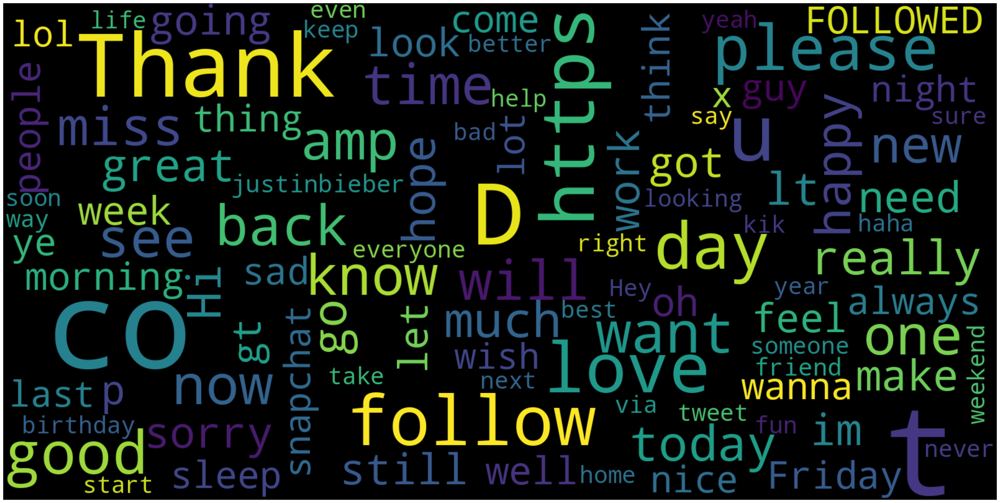

In [9]:
wordcloud = WordCloud(width=1600,height=800,max_font_size=200,max_words=100,collocations=False, background_color='black').generate(string)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### Observing the positive tweets

In [11]:
positive_tweet = df[df["label"] == 1]

In [12]:
positive_tweet.head()

,text,label
4,@MitchFAS hello :D how are you just found afte...,1
5,@nicagaray thanks!!! :))))))),1
6,"@Okami_Kai @SlyCat Yup, got about 12 of the bo...",1
9,@Andrew_Spence Thanks again! Hope you're havin...,1
10,since no ones up &amp; I'm bored :) add me htt...,1


In [13]:
positive_tweet.head()

,text,label
4,@MitchFAS hello :D how are you just found afte...,1
5,@nicagaray thanks!!! :))))))),1
6,"@Okami_Kai @SlyCat Yup, got about 12 of the bo...",1
9,@Andrew_Spence Thanks again! Hope you're havin...,1
10,since no ones up &amp; I'm bored :) add me htt...,1


In [14]:
text_positive = positive_tweet.text

In [15]:
string = pd.Series(text_positive).str.cat(sep=' ')

In [16]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

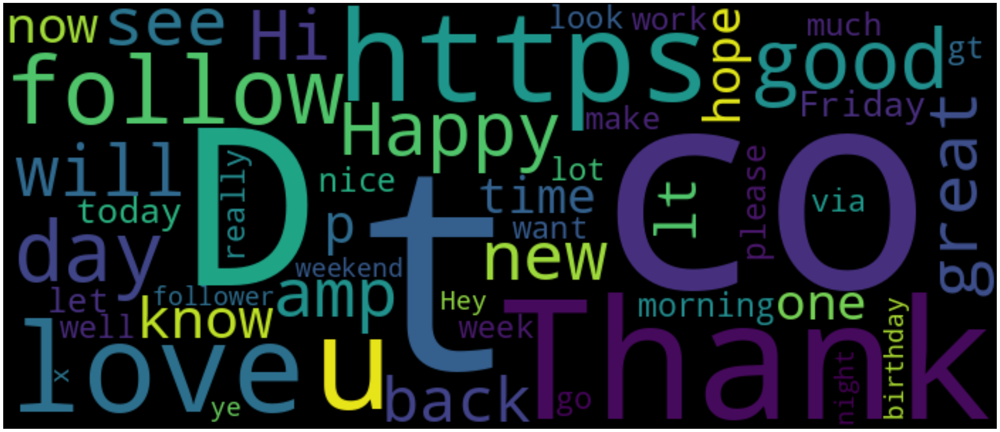

In [17]:
wordcloud = WordCloud(width=700, height=300,max_font_size=200,max_words=50,collocations=False, background_color='black').generate(string)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## Preprocessing: Lower Casing



In [18]:
positive_tweet['text_lowered'] = positive_tweet.text.str.lower()
positive_tweet[['text', 'text_lowered']].head()

<ipython-input-18-24188474e598>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_tweet['text_lowered'] = positive_tweet.text.str.lower()


,text,text_lowered
4,@MitchFAS hello :D how are you just found afte...,@mitchfas hello :d how are you just found afte...
5,@nicagaray thanks!!! :))))))),@nicagaray thanks!!! :)))))))
6,"@Okami_Kai @SlyCat Yup, got about 12 of the bo...","@okami_kai @slycat yup, got about 12 of the bo..."
9,@Andrew_Spence Thanks again! Hope you're havin...,@andrew_spence thanks again! hope you're havin...
10,since no ones up &amp; I'm bored :) add me htt...,since no ones up &amp; i'm bored :) add me htt...


In [19]:
text_positive_lowered = positive_tweet.text_lowered

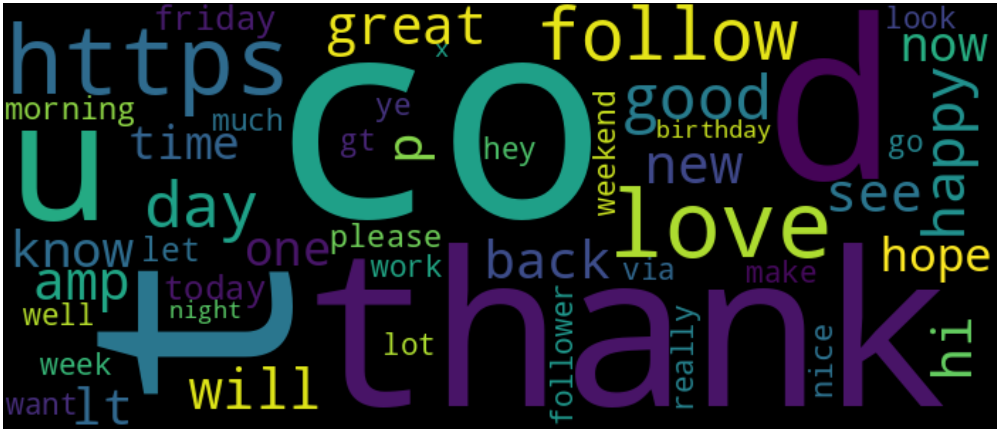

In [20]:
string = pd.Series(text_positive_lowered).str.cat(sep=' ')
wordcloud = WordCloud(width=700,height=300,max_font_size=200,max_words=50,collocations=False, background_color='black').generate(string)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Preprocessing 2: Stop Word Removal

In [21]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [22]:
# Exclude stopwords with Python's list comprehension and pandas.DataFrame.apply.
positive_tweet['remove_stopwords'] = positive_tweet['text_lowered'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
positive_tweet[['text', 'text_lowered','remove_stopwords']].head()

<ipython-input-22-b92b7d9d6253>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_tweet['remove_stopwords'] = positive_tweet['text_lowered'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))


,text,text_lowered,remove_stopwords
4,@MitchFAS hello :D how are you just found afte...,@mitchfas hello :d how are you just found afte...,@mitchfas hello :d found time wasnt following ...
5,@nicagaray thanks!!! :))))))),@nicagaray thanks!!! :))))))),@nicagaray thanks!!! :)))))))
6,"@Okami_Kai @SlyCat Yup, got about 12 of the bo...","@okami_kai @slycat yup, got about 12 of the bo...","@okami_kai @slycat yup, got 12 books far :d"
9,@Andrew_Spence Thanks again! Hope you're havin...,@andrew_spence thanks again! hope you're havin...,@andrew_spence thanks again! hope great friday...
10,since no ones up &amp; I'm bored :) add me htt...,since no ones up &amp; i'm bored :) add me htt...,since ones &amp; i'm bored :) add http://t.co/...


## Task 1: Observe the wordcloud output for the removed_stopwords data. Add additional stopwords data to remove noise from your data.

In [146]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)
stopwords.update(["https", "t", "p", "gt", "ye", "x", "u", "p", "lt", "amp", "jnlazts", "rcvcyyo0iq",  "d", "im","ff", "bam", "co", "warsaw", "barsandmelody", "969horan696", "xx", "dm", "ur", "us", "hey", "hi", "lol", "stats", "via"]) #adding our own stopwords

In [147]:
print(stopwords)

{'hence', "they'll", 'above', 'k', "where's", 'would', 'x', 'have', 'however', 'not', "when's", 'both', 'ought', "we'll", 'has', 'an', "can't", 'dm', 'any', 'at', "she's", 'xx', 'from', 'how', 'ever', 'are', 'over', 'so', 'some', 'be', "haven't", 'nor', 'what', 'who', "don't", "we'd", "what's", 'he', 'am', 'between', 'its', 'ourselves', 'them', 'each', 'through', 'which', "who's", 'those', 'and', 'p', 'www', "mustn't", "he's", 'or', 'being', 'ur', 'such', 'theirs', 'like', 'with', 'd', 'whom', 'stats', 'other', 'shall', 'u', 'own', 'you', "you're", 'yourself', 'all', 'does', 'hi', 't', 'barsandmelody', 'himself', 'against', 'my', 'about', 'co', 'for', 'me', 'yours', 'since', "that's", 'below', 'but', "you'd", 'it', 'as', 'via', "wasn't", "they've", 'was', "he'd", "couldn't", "won't", 'com', 'by', 'did', "here's", 'most', 'on', "she'd", 'up', 'itself', 'off', 'down', 'this', "shan't", 'after', 'otherwise', 'in', "hasn't", 'out', 'these', 'lol', 'do', "we're", 'no', "isn't", 'get', 'were

In [148]:
remove_stopwords = positive_tweet.remove_stopwords

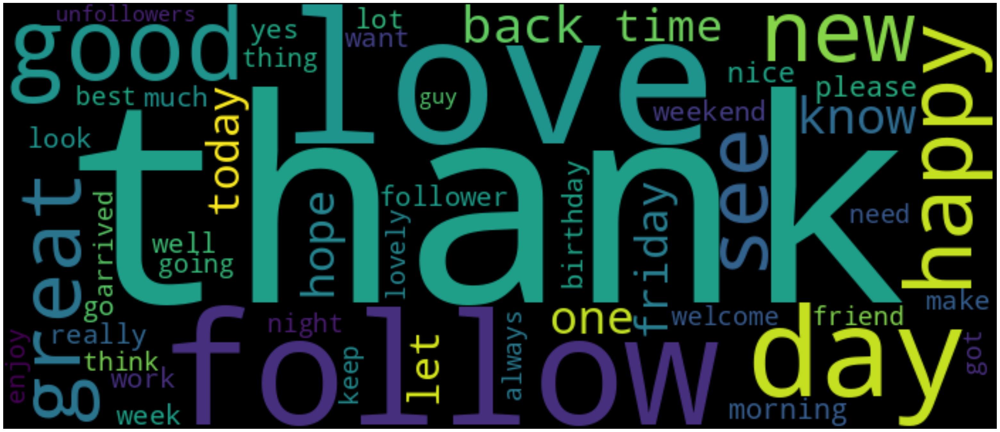

In [149]:
string = pd.Series(remove_stopwords).str.cat(sep=' ')
wordcloud = WordCloud(width=700,stopwords=stopwords, height=300,max_font_size=200,max_words=50,collocations=False, background_color='black').generate(string)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## Task 2: After analyzing the generated word cloud, discuss whether it reflects a positive sentiment. Justify your answer with examples from the word cloud analysis.



Provide your answer here: The word cloud reflects a positive sentiment. The words such as "love", "nice", "enjoy", "happy" and "good" convey feelings of positive, and  enjoyful with positive vibes.

## Task 3: Now repeat the same process with the negative tweets.

In [76]:
negative_tweet = df[df["label"] == 0]

In [77]:
negative_tweet.head()

,text,label
0,Come home to an empty house and no ape :(,0
1,Ah Mensch @Tikus09 :(,0
2,I think need 2 years training to beat the reco...,0
3,@ohkaibaeks I only have 1 though!! :(,0
7,@annayeng sorna :((((,0


In [78]:
text_negative = negative_tweet.text


In [79]:
string = pd.Series(text_negative).str.cat(sep=' ')

## Task 3: After analyzing the generated word cloud, discuss whether it reflects a negative sentiment. Justify your answer with examples from the word cloud analysis.


In [80]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

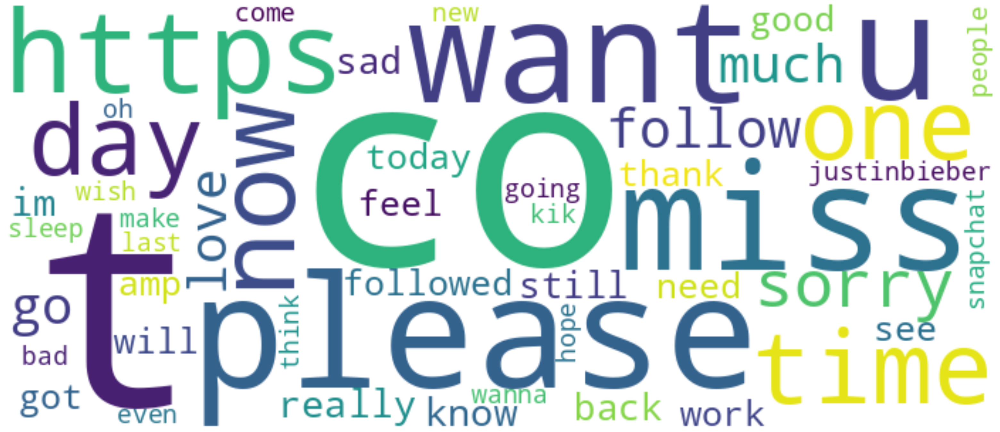

In [96]:
wordcloud = WordCloud(width=700, height=300,max_font_size=200,max_words=50,collocations=False, background_color='white').generate(string)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

**Preprocessing: Lower Casing**

In [84]:
negative_tweet['text_lowered'] = negative_tweet.text.str.lower()
negative_tweet[['text', 'text_lowered']].head()

<ipython-input-84-2f04ceb67911>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_tweet['text_lowered'] = negative_tweet.text.str.lower()


,text,text_lowered
0,Come home to an empty house and no ape :(,come home to an empty house and no ape :(
1,Ah Mensch @Tikus09 :(,ah mensch @tikus09 :(
2,I think need 2 years training to beat the reco...,i think need 2 years training to beat the reco...
3,@ohkaibaeks I only have 1 though!! :(,@ohkaibaeks i only have 1 though!! :(
7,@annayeng sorna :((((,@annayeng sorna :((((


In [86]:
text_negative_lowered = negative_tweet.text_lowered

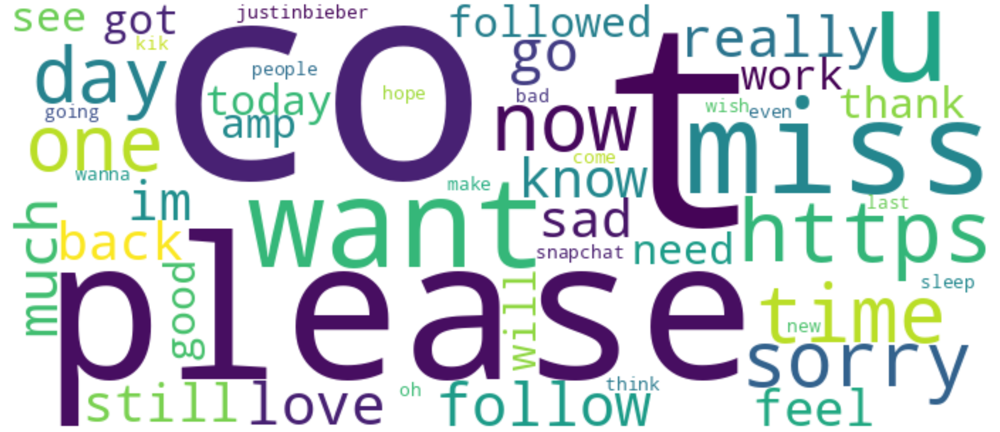

In [95]:
string = pd.Series(text_negative_lowered).str.cat(sep=' ')
wordcloud = WordCloud(width=700,height=300,max_font_size=200,max_words=50,collocations=False, background_color='white').generate(string)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

**Preprocessing 2: Stop Word Removal**

In [88]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [89]:
# Exclude stopwords with Python's list comprehension and pandas.DataFrame.apply.
negative_tweet['remove_stopwords'] = negative_tweet['text_lowered'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
negative_tweet[['text', 'text_lowered','remove_stopwords']].head()

<ipython-input-89-1aae9ac40f0b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_tweet['remove_stopwords'] = negative_tweet['text_lowered'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))


,text,text_lowered,remove_stopwords
0,Come home to an empty house and no ape :(,come home to an empty house and no ape :(,come home empty house ape :(
1,Ah Mensch @Tikus09 :(,ah mensch @tikus09 :(,ah mensch @tikus09 :(
2,I think need 2 years training to beat the reco...,i think need 2 years training to beat the reco...,think need 2 years training beat record sia :(
3,@ohkaibaeks I only have 1 though!! :(,@ohkaibaeks i only have 1 though!! :(,@ohkaibaeks 1 though!! :(
7,@annayeng sorna :((((,@annayeng sorna :((((,@annayeng sorna :((((


In [134]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)
stopwords.update(["https","kik", "n", "bc", "justinbieber", "pls", "amp","lt", "co", "gt", "im", "x", "ll", "beli", "wi", "ok", "x15", "justi", "t", "omg", "oh"]) #adding our own stopwords

In [135]:
print(stopwords)

{'hence', "they'll", 'above', 'k', "where's", 'would', 'x', 'have', 'however', 'not', "when's", 'both', 'ought', "we'll", 'has', 'an', "can't", 'any', 'at', "she's", 'from', 'how', 'ever', 'are', 'over', 'so', 'some', 'be', "haven't", 'nor', 'what', 'who', "don't", "we'd", 'beli', "what's", 'kik', 'he', 'am', 'between', 'its', 'ourselves', 'them', 'each', 'through', 'which', "who's", 'those', 'and', 'www', "mustn't", "he's", 'or', 'being', 'such', 'theirs', 'like', 'with', 'whom', 'other', 'shall', 'll', 'own', 'you', "you're", 'yourself', 'oh', 'all', 'does', 't', 'himself', 'against', 'my', 'about', 'co', 'for', 'me', 'yours', 'since', "that's", 'below', 'but', "you'd", 'it', 'as', "wasn't", "they've", 'was', "he'd", "couldn't", "won't", 'com', 'by', 'did', "here's", 'most', 'on', "she'd", 'up', 'itself', 'off', 'down', 'this', "shan't", 'after', 'otherwise', 'in', "hasn't", 'out', 'these', 'do', "we're", 'no', "isn't", 'get', 'were', 'doing', 'had', 'also', 'during', "there's", 'fur

In [136]:
remove_stopwords = negative_tweet.remove_stopwords

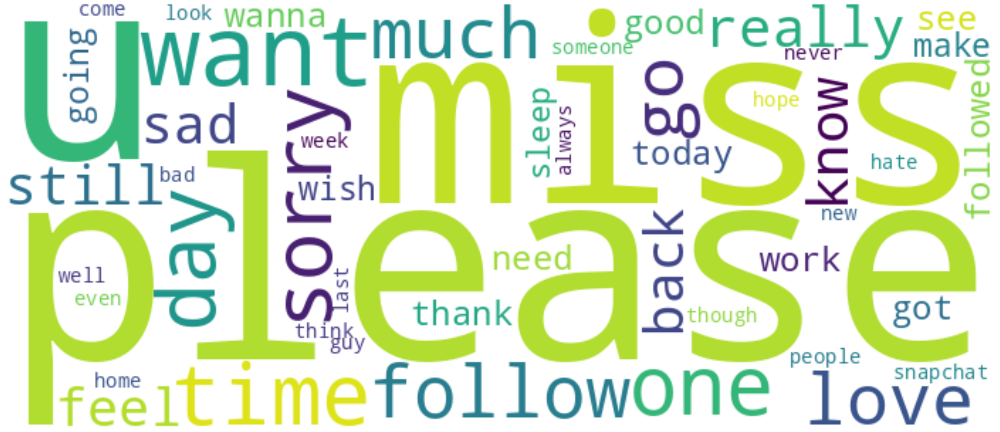

In [137]:
string = pd.Series(remove_stopwords).str.cat(sep=' ')
wordcloud = WordCloud(width=700,stopwords=stopwords, height=300,max_font_size=200,max_words=50,collocations=False, background_color='white').generate(string)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

The word cloud reflects a negative sentiment. The words such as "sorry", "sad", "bad", "miss" and "please" convey feelings of guilt, and  sadness.